# House Sales in King County, USA


## **DATA SET**
1. This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.
2. it contains 21 columns and 21613 rows.
3. data is taken from 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DA0101EN-SkillsNetwork/labs/FinalModule_Coursera/data/kc_house_data_NaN.csv'

| Variable      | Description                                                                                                 |
| ------------- | ----------------------------------------------------------------------------------------------------------- |
| id            | A notation for a house                                                                                      |
| date          | Date house was sold                                                                                         |
| price         | Price is prediction target                                                                                  |
| bedrooms      | Number of bedrooms                                                                                          |
| bathrooms     | Number of bathrooms                                                                                         |
| sqft_living   | Square footage of the home                                                                                  |
| sqft_lot      | Square footage of the lot                                                                                   |
| floors        | Total floors (levels) in house                                                                              |
| waterfront    | House which has a view to a waterfront                                                                      |
| view          | Has been viewed                                                                                             |
| condition     | How good the condition is overall                                                                           |
| grade         | overall grade given to the housing unit, based on King County grading system                                |
| sqft_above    | Square footage of house apart from basement                                                                 |
| sqft_basement | Square footage of the basement                                                                              |
| yr_built      | Built Year                                                                                                  |
| yr_renovated  | Year when house was renovated                                                                               |
| zipcode       | Zip code                                                                                                    |
| lat           | Latitude coordinate                                                                                         |
| long          | Longitude coordinate                                                                                        |
| sqft_living15 | Living room area in 2015(implies-- some renovations) This might or might not have affected the lotsize area |
| sqft_lot15    | LotSize area in 2015(implies-- some renovations)                                                            |


### Python comes with many helpfull libraries which will helps us for visualization and Analysizing
### Importing the following important libraries:


In [1]:
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt # plots and graphs
import numpy as np # linear algebra
import seaborn as sns # plots heatmap etc
from sklearn.pipeline import Pipeline 
from sklearn.preprocessing import StandardScaler,PolynomialFeatures
from sklearn.linear_model import LinearRegression # Regression models
%matplotlib inline

# Module 1: Importing Data Sets


Now Loading the csv file:
and reading the data set

In [2]:
file_name=r'C:\Users\hp\OneDrive\Desktop\course ra\Data Analysis with Python\week 6 final_exam\kc_house_data_NaN.csv'
# file_name='https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DA0101EN-SkillsNetwork/labs/FinalModule_Coursera/data/kc_house_data_NaN.csv'
df=pd.read_csv(file_name)

In [3]:
df.head()

,Unnamed: 0,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,0,7129300520,20141013T000000,221900.0,3.0,1.00,1180,5650,1.0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,1,6414100192,20141209T000000,538000.0,3.0,2.25,2570,7242,2.0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,2,5631500400,20150225T000000,180000.0,2.0,1.00,770,10000,1.0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,3,2487200875,20141209T000000,604000.0,4.0,3.00,1960,5000,1.0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,4,1954400510,20150218T000000,510000.0,3.0,2.00,1680,8080,1.0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
df.dtypes

Unnamed: 0         int64
id                 int64
date              object
price            float64
bedrooms         float64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

We use the method describe to obtain a statistical summary of the dataframe.


In [5]:
df.describe()

,Unnamed: 0,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,21613.00000,2.161300e+04,2.161300e+04,21600.000000,21603.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,...,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,10806.00000,4.580302e+09,5.400881e+05,3.372870,2.115736,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,...,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,6239.28002,2.876566e+09,3.671272e+05,0.926657,0.768996,918.440897,4.142051e+04,0.539989,0.086517,0.766318,...,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,0.00000,1.000102e+06,7.500000e+04,1.000000,0.500000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,...,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,5403.00000,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,...,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,10806.00000,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,...,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,16209.00000,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,...,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,21612.00000,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,...,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


# Module 2: Data Wrangling


Now removing the data set which doesnot affect the price of house as "id" and "Unnamed" is not useful for us so we will remove that columns

### Removing the unwanted columns

In [6]:
df.drop(["id",'Unnamed: 0'], axis=1, inplace=True)
df.describe()


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,21600.000000,21603.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,5.400881e+05,3.372870,2.115736,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,3.671272e+05,0.926657,0.768996,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,7.500000e+04,1.000000,0.500000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


## Mising value replacement or dropping the Column

We can see we have missing values for the columns <code> bedrooms</code>  and <code> bathrooms </code>


In [7]:
print("number of NaN values for the column bedrooms :", df['bedrooms'].isnull().sum())
print("number of NaN values for the column bathrooms :", df['bathrooms'].isnull().sum())


number of NaN values for the column bedrooms : 13
number of NaN values for the column bathrooms : 10


### We can replace the missing values of the column 'bedrooms'with the mean of the column  'bedrooms'  using the method replace().

In [8]:
mean=df['bedrooms'].mean()
df['bedrooms'].replace(np.nan,mean, inplace=True)

We also replace the missing values of the column <code>'bathrooms'</code> with the mean of the column  <code>'bathrooms' </code> using the method <code>replace()</code> and  setting  the <code> inplace </code>  parameter top <code> True </code>


In [9]:
mean=df['bathrooms'].mean()
df['bathrooms'].replace(np.nan,mean, inplace=True)

In [10]:
print("number of NaN values for the column bedrooms :", df['bedrooms'].isnull().sum())
print("number of NaN values for the column bathrooms :", df['bathrooms'].isnull().sum())

number of NaN values for the column bedrooms : 0
number of NaN values for the column bathrooms : 0


# Module 3: Exploratory Data Analysis


In [11]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,20141013T000000,221900.0,3.0,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,20141209T000000,538000.0,3.0,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,20150225T000000,180000.0,2.0,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,20141209T000000,604000.0,4.0,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,20150218T000000,510000.0,3.0,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [12]:
floors_counts = df['floors'].value_counts().to_frame()
floors_counts.rename(columns={'floors' : "values_houses_counts"}, inplace=True)
floors_counts

,values_houses_counts
1.0,10680
2.0,8241
1.5,1910
3.0,613
2.5,161
3.5,8


## to find out the effective columns in the given data which is significatly related to PRICE of house

In [13]:
df.head(2)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,20141013T000000,221900.0,3.0,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,20141209T000000,538000.0,3.0,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639


## lets see the various relation of variable with target PRICE

## so taking Ho = if there is no correlation in between the Price and features
## And       Ha = if there is correlation in between the Price and features


,bedrooms,price
bedrooms,1.000000,0.308797
price,0.308797,1.000000


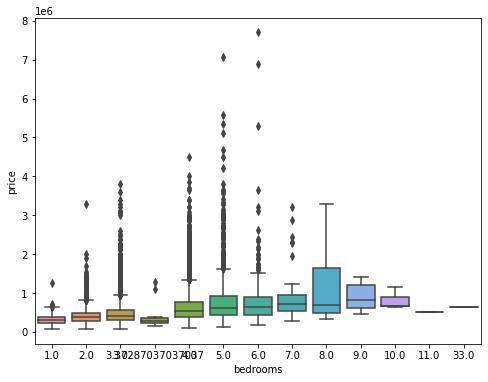

In [14]:
# price VS bedrooms
plt.figure(figsize=(8,6))
sns.boxplot(x="bedrooms", y="price", data=df)
df[['bedrooms','price']].corr()

,grade,price
grade,1.000000,0.667434
price,0.667434,1.000000


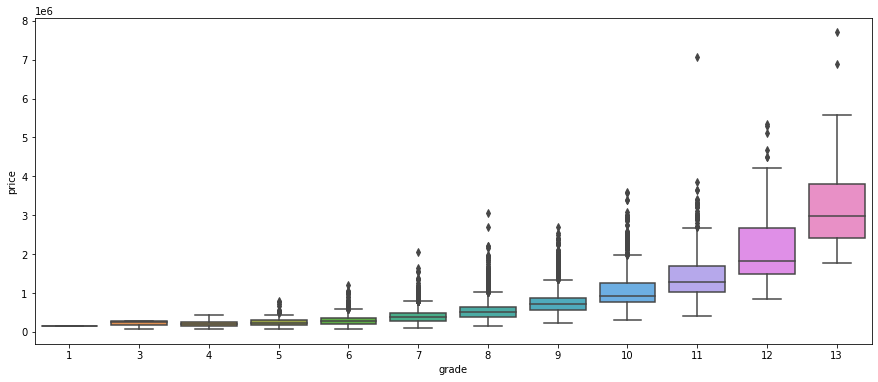

In [15]:
# price VS grade
plt.figure(figsize=(15,6))
sns.boxplot(x="grade", y="price", data=df)
df[['grade','price']].corr()

,bathrooms,price
bathrooms,1.000000,0.525738
price,0.525738,1.000000


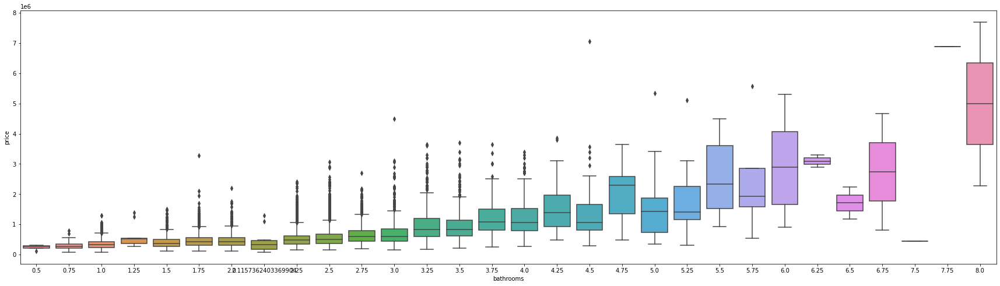

In [16]:
# price VS bathrooms
plt.figure(figsize=(30,8))
sns.boxplot(x="bathrooms", y="price", data=df)
df[['bathrooms','price']].corr()

,sqft_living,price
sqft_living,1.000000,0.702035
price,0.702035,1.000000


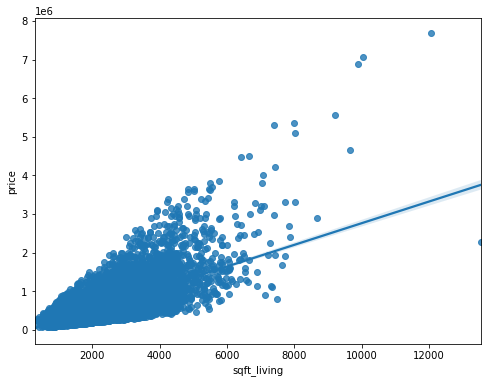

In [17]:
# price VS sqft_living
plt.figure(figsize=(8,6))
sns.regplot(x="sqft_living", y="price", data=df)
df[['sqft_living','price']].corr()

,sqft_lot,price
sqft_lot,1.000000,0.089661
price,0.089661,1.000000


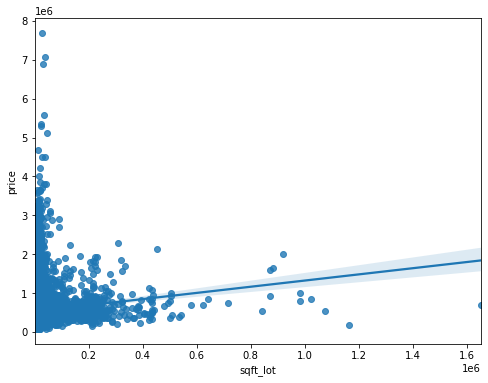

In [18]:
# price VS sqft_lot
plt.figure(figsize=(8,6))
sns.regplot(x="sqft_lot", y="price", data=df)
df[['sqft_lot','price']].corr()

In [19]:
waterfront_counts = df['waterfront'].value_counts().to_frame()
waterfront_counts.rename(columns={'waterfront' : "values_waterfront_houses_counts"}, inplace=True)
waterfront_counts

,values_waterfront_houses_counts
0,21450
1,163


<AxesSubplot:xlabel='waterfront', ylabel='price'>

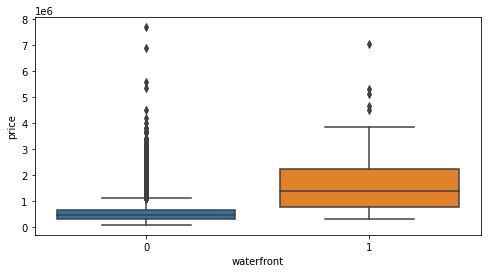

In [20]:
plt.figure(figsize=(8,4))
sns.boxplot(x='waterfront',y='price',data=df)

In [21]:
# also we can confirm from corr() function
df[['sqft_above','price']].corr()

,sqft_above,price
sqft_above,1.000000,0.605567
price,0.605567,1.000000


 using the Pandas method <code>corr()</code>  to find the feature other than price that is most correlated with price.


In [22]:
df.corr()['price'].sort_values()

zipcode         -0.053203
long             0.021626
condition        0.036362
yr_built         0.054012
sqft_lot15       0.082447
sqft_lot         0.089661
yr_renovated     0.126434
floors           0.256794
waterfront       0.266369
lat              0.307003
bedrooms         0.308797
sqft_basement    0.323816
view             0.397293
bathrooms        0.525738
sqft_living15    0.585379
sqft_above       0.605567
grade            0.667434
sqft_living      0.702035
price            1.000000
Name: price, dtype: float64

## here we see that the "sqft_living","grade","sqft_above","sqft_living15","bathrooms" are above 50% relationship with the Price so we will see on the bases of P-value 

#### the p-value is < 0.001: we say there is strong evidence that the correlation is significant.
#### the p-value is $<$ 0.05: there is moderate evidence that the correlation is significant.
#### the p-value is $<$ 0.1: there is weak evidence that the correlation is significant.
#### the p-value is $>$ 0.1: there is no evidence that the correlation is significant.

In [23]:
from scipy import stats

In [24]:
def relation(value_1):
    pearson_coef, p_value = stats.pearsonr(value_1, df['price'])
    print(f"The Pearson Correlation Coefficient is for {pearson_coef} with a P-value of P = {p_value}")  

In [25]:
relation(df['sqft_living'])

The Pearson Correlation Coefficient is for 0.7020350546118 with a P-value of P = 0.0


#### here we can see that correlationship is quite strong as well as the p-value <0.001 so the correlation is significantly strong

## we will reject the Ho as there is correlation in between Price and "sqft_living"


In [26]:
relation(df['grade'])

The Pearson Correlation Coefficient is for 0.6674342560202369 with a P-value of P = 0.0


## we will reject the Ho as there is correlation in between Price and "grade"


#### here also correlationship is moderate as also p-value shows that correlation is significant

In [27]:
relation(df['sqft_above'])

The Pearson Correlation Coefficient is for 0.6055672983560781 with a P-value of P = 0.0


#### here also correlationship is moderate as also p-value shows that correlation is significant

## we will reject the Ho as there is correlation in between Price and "sqft_above"


In [28]:
relation(df['sqft_living15'])

The Pearson Correlation Coefficient is for 0.585378903579568 with a P-value of P = 0.0


#### here also correlationship is moderate as also p-value shows that correlation is significant

## we will reject the Ho as there is correlation in between Price and "sqft_living15"


In [29]:
relation(df['bathrooms'])

The Pearson Correlation Coefficient is for 0.5257375111242717 with a P-value of P = 0.0


#### here also correlationship is moderate as also p-value shows that correlation is significant

## we will reject the Ho as there is correlation in between Price and the number of "bathrooms"


In [30]:
relation(df['waterfront'])

The Pearson Correlation Coefficient is for 0.2663694340306021 with a P-value of P = 0.0


## we will reject the Ho as there is correlation in between Price and "waterfront"


In [31]:
relation(df['zipcode'])

The Pearson Correlation Coefficient is for -0.053202854298325594 with a P-value of P = 5.011050503382451e-15


# Module 4: Model Development


# Multi linear Regression Model



Fitting a linear regression model to predict the <code>'price'</code> using the list of features:


In [32]:
features =["floors", "waterfront","lat" ,"bedrooms" ,"sqft_basement" ,"view" ,"bathrooms","sqft_living15","sqft_above","grade","sqft_living"]  
Z = df[features]
Y = df['price']
lm2 = LinearRegression()
lm2.fit(Z,Y)
YHAT_1=lm2.predict(Z)
YHAT_1[0:4]

array([283270.3900746 , 662572.30128725, 306267.58455146, 408476.54986747])

In [33]:
lm2.coef_    ### this are the coefficient of various parameters of Z for multiple linear regression model

array([-2.92790793e+04,  6.02002523e+05,  6.72993098e+05, -2.59674430e+04,
        6.44145022e+01,  6.70824472e+04, -3.22416757e+03,  4.44293114e+00,
        6.49412866e+01,  8.20072277e+04,  1.29355789e+02])

In [34]:

lm2.score(Z,Y)

0.6576951666037502

In [35]:
lm2.intercept_

-32390308.398635708

In [36]:
Input=[('scale',StandardScaler()),('polynomial', PolynomialFeatures(include_bias=False)),('model',LinearRegression())]


Using the list to create a pipeline object to predict the 'price', fitting the object using the features in the list <code>features</code>.


In [37]:
pipe = Pipeline(Input)

In [38]:
pipe.fit(Z,df['price'])
Ylm_2 = pipe.predict(Z)
Ylm_2[0:4]

array([349638.25, 559087.25, 449488.25, 393216.25])

In [39]:
pipe.score(Z,Y)

0.7513406905914715

##  the value of  **R^2** is **0.7513**

# Model Evaluation Using Visualization

Text(0.5, 1.0, 'Variation of Price with Square feet of living Area')

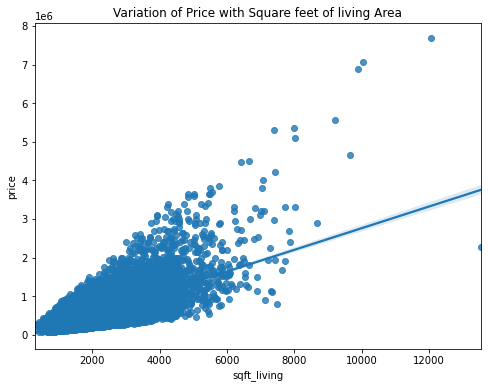

In [40]:
# Regression plot of prive Vs "sqft_living"
plt.figure(figsize=(8,6))
sns.regplot(x="sqft_living", y="price", data=df)
plt.title("Variation of Price with Square feet of living Area")

### on seeing graph we can say that the more fall around the genrating line but data above the line is higher so this increses the mean

Text(0.5, 1.0, 'Variation of PRICE with GRADE')

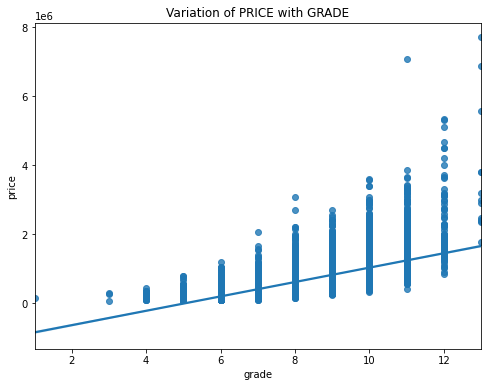

In [41]:
plt.figure(figsize=(8,6))
sns.regplot(x="grade", y="price", data=df)
plt.title("Variation of PRICE with GRADE")

#### here in this plot data is more above the line so it is also incresing the mean

C:\Users\hp\anaconda3.0\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


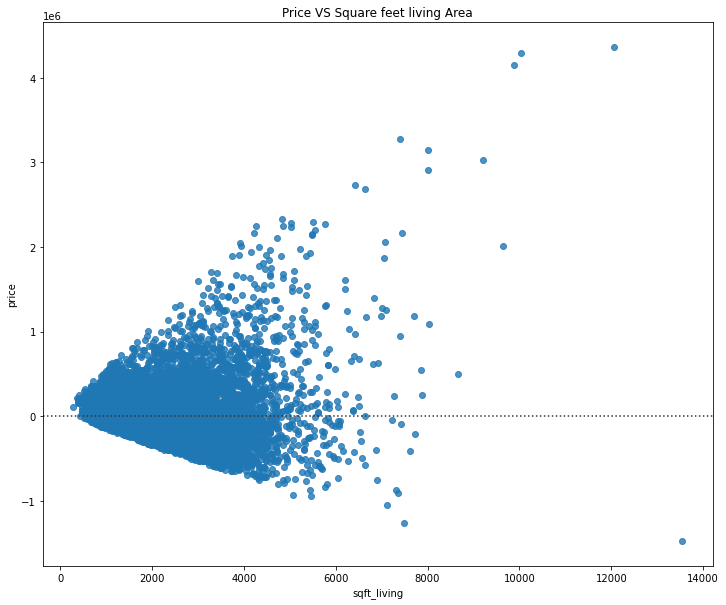

In [42]:

plt.figure(figsize=(12, 10))
sns.residplot(df['sqft_living'], df['price'])
plt.title("Price VS Square feet living Area")
plt.show()

# Module 5: Model Evaluation and Refinement


Import the necessary modules:


In [43]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
print("done")

done


We will split the data into training and testing sets:


In [44]:
features =["floors", "waterfront","lat" ,"bedrooms" ,"sqft_basement" ,"view" ,"bathrooms","sqft_living15","sqft_above","grade","sqft_living"]    
X = df[features]
Y = df['price']

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.15, random_state=1)


print("number of test samples:", x_test.shape[0])
print("number of training samples:",x_train.shape[0])

number of test samples: 3242
number of training samples: 18371


In [45]:
from ipywidgets import interact, interactive, fixed, interact_manual


In [46]:
# lets check for overfitting and underfitting
def DistributionPlot(redFun, blueFun, redNam, blueNam, Title):
    
    plt.figure(figsize=(12, 10))

    ax1 = sns.distplot(redFun, hist=False, color="r", label=redNam)
    ax2 = sns.distplot(blueFun, hist=False, color="b", label=blueNam, ax=ax1)

    plt.title(Title)
    plt.xlabel('Price')
    plt.ylabel('Proportion of Houses')

    plt.show()
    plt.close()

In [47]:
def PollyPlot(X1_train, X1_test, y1_train, y1_test, lr,poly_transform):
    plt.figure(figsize=(12, 10))
    
    
    #training data 
    #testing data 
    # lr:  linear regression object 
    #poly_transform:  polynomial transformation object 
 
    x_max = max([xtrain.values.max(), xtest.values.max()])

    x_min = min([xtrain.values.min(), xtest.values.min()])

    x=np.arange(x_min, x_max, 0.1)
    lr= LinearRegression()

    plt.plot(X1_train, y1_train, 'ro', label='Training Data')
    plt.plot(X1_test, y1_test, 'go', label='Test Data')
    plt.plot(x, lr.predict(poly_transform.fit_transform(x.reshape(-1, 1))), label='Predicted Function')
    plt.ylim([-10000, 60000])
    plt.ylabel('Price')
    plt.legend()

In [48]:
lr =LinearRegression()
x_train_1 = x_train[['sqft_living','grade','sqft_above','sqft_living15']]
x_test_1= x_test[['sqft_living','grade','sqft_above','sqft_living15']]
lr.fit(x_train_1,y_train)
# lr.score(x_test_1,y_test)

LinearRegression()

In [49]:
Yhat_train = lr.predict(x_train_1)
Yhat_train[0:5]

array([161048.59020148, 559298.88559007, 321509.12760485, 838848.95839859,
       598614.06789459])

In [50]:
Yhat_test = lr.predict(x_test_1)
Yhat_test[0:5]

array([782712.2791107 , 398172.67681528, 951299.8824463 , 696174.33436729,
       264022.22236605])

C:\Users\hp\anaconda3.0\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\hp\anaconda3.0\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


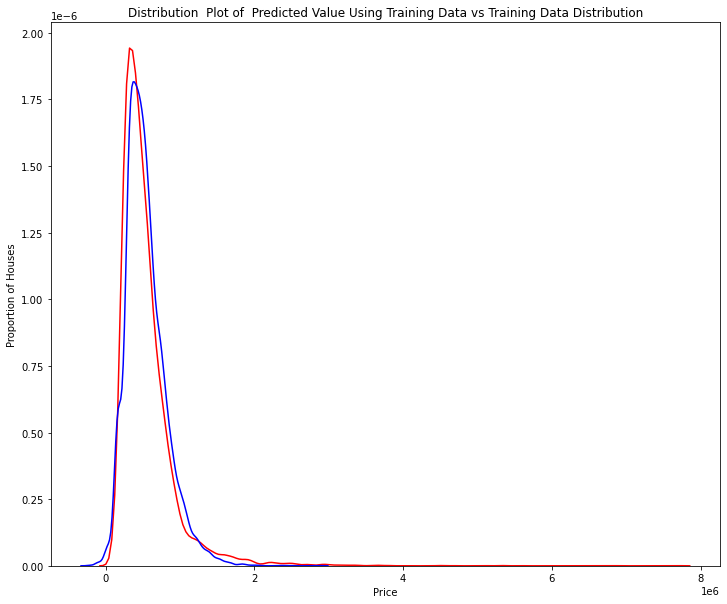

In [51]:
Title = 'Distribution  Plot of  Predicted Value Using Training Data vs Training Data Distribution'
DistributionPlot(y_train, Yhat_train, "Actual Values (Train)", "Predicted Values (Train)", Title)

C:\Users\hp\anaconda3.0\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
C:\Users\hp\anaconda3.0\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


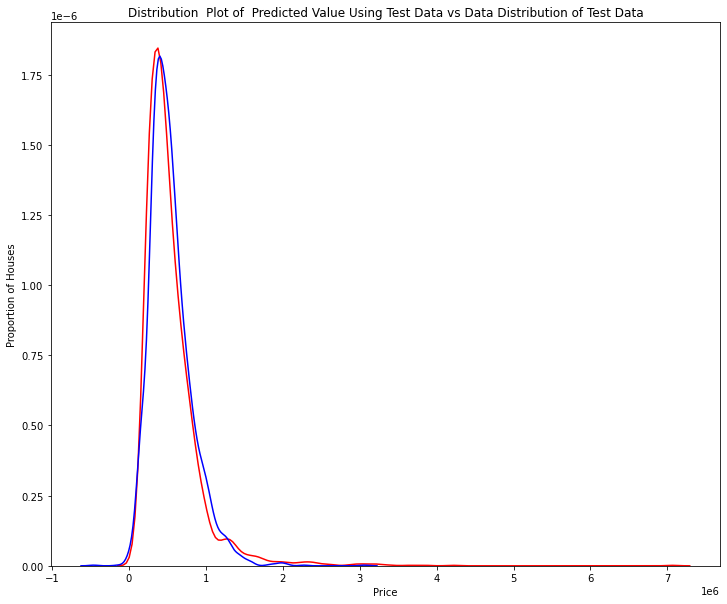

In [52]:
Title='Distribution  Plot of  Predicted Value Using Test Data vs Data Distribution of Test Data'
DistributionPlot(y_test,Yhat_test,"Actual Values (Test)","Predicted Values (Test)",Title)

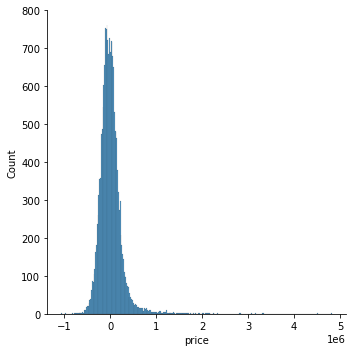

In [53]:
sns.displot(y_train-Yhat_train)

Comparing Figure 1 and Figure 2, it is evident that the distribution of the test data in Figure 1 and 2 is almost same at fitting the data.they almost follow the same shape. the very very small difference in Figure 2 and 1 is in range of 1 to 2 . 



Creating and fitting a Ridge regression object using the training data by setting the regularization parameter to 0.1.


In [54]:
from sklearn.linear_model import Ridge

In [55]:
Ridge_Model= Ridge(alpha= 0.1)
Ridge_Model.fit(x_train,y_train)
Ridge_Model.score(x_test,y_test)

0.6478759163939112

## R^2 value is 0.647



Performing a second order polynomial transform on both the training data and testing data. .


In [56]:
pr=PolynomialFeatures(degree=2)
x_train_pr=pr.fit_transform(x_train)
x_test_pr=pr.fit_transform(x_test)

In [57]:
Ridge_Model_1= Ridge(alpha=0.1)
Ridge_Model_1.fit(x_train_pr,y_train)
Y_Ridge_Pr = Ridge_Model_1.predict(x_train_pr)

In [58]:
Ridge_Model_1.score(x_test_pr,y_test)

0.7002744262868892

## Here we can see by Multiple Regression Model we get an accuracy of around 66% whereas after fitting Pipeline I got 76% accuracy and Rigdge object fitting accuracy is around 70% so Creating a pipeline fit in between the variables and target gives maximum accuracy in my prediction.